In [1]:
import pandas as pd
from pathlib import Path
import inspect 
import numpy as np
import datetime
import os
import json
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter
from dotmap import DotMap
import torch
import torch.nn.init as init
import torch.nn as nn
import pickle
import torch.autograd as autograd
from torchviz import make_dot
from torchsummary import summary
from termcolor import colored
import seaborn as sns
sns.set_theme(style="white", rc={"axes.grid": False})


from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.metrics.pairwise import rbf_kernel
from scipy.stats import wasserstein_distance, entropy
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

In [2]:
reserved = int(torch.cuda.max_memory_reserved() / 1000 / 1000)
gpu_available = torch.cuda.is_available()

print(colored(f"GPU available! {torch.cuda.get_device_name()}. Memory reserved: {reserved}MB", "green") if gpu_available else colored("No GPU. Running on CPU", "red"))

No GPU. Running on CPU


In [3]:
# For Macbook M3
device = "mps"  # device

## PICK UP WHERE LEFT OFF

**Current Status**
1. Made progress on getting appreciable accuracy on FCNN_night notebook for E0 and rb. MixMaxScaler is the way to go. Since we have no negative value for E0 and rb. Used sigmoid on last layer too.
2. Move that architecture here into Learning Block and see how it performs.
3. Can also try and add a physics based loss on dNEE as regularizer

In [4]:
timestamp = datetime.datetime.now()
timestamp = f"{timestamp.year}-{timestamp.month}-{timestamp.day}_{timestamp.hour}-{timestamp.minute}-{timestamp.second}-{timestamp.microsecond}"

save_dir = Path(timestamp)
if save_dir.exists():
    raise f"Directory exists: {save_dir.as_posix()}"
os.makedirs(save_dir.as_posix())

In [5]:
config = DotMap({"flux_model": "night"})

In [6]:
writer = SummaryWriter(save_dir.joinpath("tensorboard"))

## Model Building and Training

### Data

In [7]:
data = pd.read_parquet("pivae_paper/data_manipulation/final_night_data.parquet")

In [8]:
def set_season_tag(df, isnorth = True):
    if isnorth:
        df["season"] = (df['DateTime'].dt.month%12 + 3) // 3 # print(seasons)
    else:
        df["season"] = ((df['DateTime'].dt.month + 6)%12 + 3)//3
    return df, "season"

def extract_time_features(df):
    """
    Extract features from the timestamp for model training.
    
    Parameters:
    data (pd.DataFrame): DataFrame with 'Timestamp' and 'NEE' columns.
    
    Returns:
    pd.DataFrame: DataFrame with extracted features, list: features added to dataframe
    """
    df = df.copy()
    df['hour'] = df['DateTime'].dt.hour
    df['dayofweek'] = df['DateTime'].dt.dayofweek
    df['month'] = df['DateTime'].dt.month
    df['dayofyear'] = df['DateTime'].dt.dayofyear
    return df, ["hour", "dayofweek", "month", "dayofyear"]

def split_data_years(df, train_years, test_years, test_size=0.2):
    """
    Split data into training and test sets.
    
    Parameters:
    data (pd.DataFrame): DataFrame with 'Timestamp' and 'NEE' columns.
    train_years (int): Years to include in training data
    test_years (int): Years to include in test data
    
    Returns:
    tuple: Training and test DataFrames.
    """
    
    train_data = df[df.apply(lambda x: x['DateTime'].year in train_years, axis=1)]
    test_data = df[df.apply(lambda x: x['DateTime'].year in test_years, axis=1)]
    return train_data.reset_index(drop=True), test_data.reset_index(drop=True)
    
def split_data(df, train_year_thresh, test_year_thresh=2018, test_size=0.2):
    """
    Split data into training and test sets.
    
    Parameters:
    data (pd.DataFrame): DataFrame with 'Timestamp' and 'NEE' columns.
    train_year_thresh (int): Year till which to include in training data (inclusive)
    test_year_thresh (int): Year till which to include in test data (inclusive)
    
    Returns:
    tuple: Training and test DataFrames.
    """
    assert train_year_thresh <= test_year_thresh, "train_year_thresh has to be less than test_year_thresh"
    train_data = df[df.DateTime.dt.year <= train_year_thresh]
    test_data = df[df.DateTime.dt.year >= test_year_thresh]
    return train_data.reset_index(drop=True), test_data.reset_index(drop=True)

def physics_nee(k, T, Tref=10, T0=46.02):
    e0 = k[:, 0]
    rb = k[:, 1]
    exp_term = np.exp(e0 * (1.0 / (Tref - T0) - 1.0 / (T - T0)))
    NEE = rb * exp_term
    return NEE

In [9]:
data['year'] = data.DateTime.dt.year

In [10]:
data["NEE_phy"] = physics_nee(data[["E0", "rb"]].values, data.Ta.values)

In [11]:
drivers = np.array(['Ta', 'H', 'Tau', 'LE_strg', 'RH', 'VPD', 'Rg', 'Ustar', 'Tsoil1', 'Tsoil2'])

In [12]:
data, season_feat = set_season_tag(data)
data, time_feat = extract_time_features(data)

In [13]:
data = data[data["dNEE"].notna()].reset_index(drop=True)

In [14]:
drivers = np.concatenate([drivers, [season_feat], time_feat])

In [15]:
columns_to_check_na = np.concatenate([drivers, ["NEE", "dTa"]])

idx = (np.sum(data[columns_to_check_na].notna(), axis=1) == columns_to_check_na.shape[0])
data = data.loc[idx].reset_index(drop=True)

### Training Data 

In [16]:
#train_data, test_data = split_data(data, 2015)
train_data, test_data = split_data_years(data, [2012, 2016, 2018], [2015, 2017])

In [17]:
#drivers = np.append(drivers, ["NEE"])
X_train = train_data[drivers]
NEE_train = train_data["NEE_next"]
dT_train = train_data["dTa"]
pNEE_train = train_data["NEE_phy"]
dNEE_train = train_data["dNEE"]
bNEE_train = train_data["NEE"]
K_train = train_data[["E0", "rb"]]

X_test = test_data[drivers]
NEE_test = test_data["NEE_next"]
pNEE_test = test_data["NEE_phy"]
dT_test = test_data["dTa"]
dNEE_test = test_data["dNEE"]
bNEE_test = test_data["NEE"]
K_test = test_data[["E0", "rb"]]


In [18]:
normalizer_x = MinMaxScaler()

X_train = normalizer_x.fit_transform(X_train)
X_test = normalizer_x.transform(X_test)

normalizer_k = MinMaxScaler()
normalizer_k.fit(K_train)
K_train = (K_train / normalizer_k.data_max_).values
K_test = (K_test / normalizer_k.data_max_).values


# K_train = normalizer_k.fit_transform(K_train)
# K_test = normalizer_k.transform(K_test)

In [19]:
with open(save_dir.joinpath("normalizer_x.pickle"), "wb") as fp:
    pickle.dump(normalizer_x, fp)
with open(save_dir.joinpath("normalizer_k.pickle"), "wb") as fp:
    pickle.dump(normalizer_k, fp)

In [20]:
config.data.X = drivers.tolist()
config.data.train_size = X_train.shape[0]
config.data.train_start_date = train_data["DateTime"].iloc[0].ctime()
config.data.train_end_date = train_data["DateTime"].iloc[-1].ctime()
config.data.test_size = X_test.shape[0]
config.data.test_start_date = test_data["DateTime"].iloc[0].ctime()
config.data.test_end_date = test_data["DateTime"].iloc[-1].ctime()

config.data.train_years = np.unique(train_data.DateTime.dt.year).tolist()
config.data.test_years = np.unique(train_data.DateTime.dt.year).tolist()

### Model Building

In [21]:
normalizer_k.data_min_,  normalizer_k.data_max_# normalizer_k.mean_, normalizer_k.scale_

(array([50.        ,  1.39304428]), array([249.83672414,  10.12113029]))

In [22]:
class PERNN_night(nn.Module):
    def __init__(self, input_dim, learning_dims_1, learning_dims_2, residual_dims, normalizer_k, activation=nn.ReLU):
        super(PERNN_night, self).__init__()

        self.input_dim = input_dim
        self.activation = activation
        self.Tref = torch.tensor(10).to(device)
        self.T0 = torch.tensor(46.02).to(device)
        self.learning_dims_1 = learning_dims_1
        self.learning_dims_2 = learning_dims_2
        self.residual_dims = residual_dims
        self.k_min = torch.tensor(normalizer_k.data_min_, dtype=torch.float32).view((-1, 2)).to(device)
        self.k_max = torch.tensor(normalizer_k.data_max_, dtype=torch.float32).view((-1, 2)).to(device)
        #self.k_mean = torch.tensor(normalizer_k.mean_, dtype=torch.float32).view((-1, 2)).to(device)
        #self.k_std = torch.tensor(normalizer_k.scale_, dtype=torch.float32).view((-1, 2)).to(device)
        
        # Learning Blocks network
        modules = self.append_linear_modules(self.input_dim, self.learning_dims_1)
        modules.append(self.activation())
        self.latent_space = nn.Sequential(*modules)

        # Decoder network for E0 and rb
        modules = self.append_linear_modules(self.learning_dims_1[-1], self.learning_dims_2)
        modules.append(nn.Linear(self.learning_dims_2[-1], 2))
        modules.append(nn.Sigmoid())
        self.learning_block = nn.Sequential(*modules)

        # Decoder network for residual
        modules = self.append_linear_modules(self.learning_dims_1[-1], self.residual_dims) 
        modules.append(nn.Linear(self.residual_dims[-1], 1))
        modules.append(self.activation())
        #modules.append(nn.Tanh())
        self.residual_block = nn.Sequential(*modules)

    def append_linear_modules(self, in_dim, dims, activation=None):
        modules = []
        for i, dim in enumerate(dims):
            modules.append(nn.Linear(in_dim, dim))
            modules.append(self.activation()) if not activation else modules.append(activation())
            modules.append(nn.LayerNorm(dim))
            in_dim = dim
        return modules

    def learning_block_forward(self, x):
        latent_space = self.latent_space(x)
        k = self.learning_block(latent_space)
        return k, latent_space
        
    def forward(self, x):
        k, latent_space = self.learning_block_forward(x)
        #k = (k * self.k_std) + self.k_mean
        k = k * self.k_max
        nee_phy = self.physics_model(k, x[:, 0].view((-1, 1)))
        residual = self.residual_block(latent_space)
        return residual + nee_phy, k, nee_phy, residual
    
    def physics_model(self, k, T):

        e0 = k[:, 0].view((-1, 1))
        rb = k[:, 1].view((-1, 1))
        exp_term = torch.exp(e0 * (1.0 / (self.Tref - self.T0) - 1.0 / (T - self.T0))).view((-1, 1))
        NEE = rb * exp_term
        
        return NEE
        # Incorporate boundary condition (NEE_t should be close to NEE_{t-1})

# PICK UP: 
- ### Fix Physics Model to Predict dNEE
- ### Incorporate denormalizer using z-score in NN
- ### Fix e0, rb separate to now combined K in training loops

In [23]:
class MMD_loss(nn.Module):
    'description'
    # function class which calculates the MMD distance of 2 distributions

    def __init__(self, kernel_mul = 2.0, kernel_num = 5):
        super(MMD_loss, self).__init__()

        self.kernel_num = kernel_num
        self.kernel_mul = kernel_mul
        self.fix_sigma = None
        return
    
    def guassian_kernel(self, source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
        n_samples = int(source.size()[0])+int(target.size()[0])
        total = torch.cat([source, target], dim=0)

        total0 = total.unsqueeze(0).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
        total1 = total.unsqueeze(1).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
        L2_distance = ((total0-total1)**2).sum(2) 
        if fix_sigma:
            bandwidth = fix_sigma
        else:
            bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)
        bandwidth /= kernel_mul ** (kernel_num // 2)
        bandwidth_list = [bandwidth * (kernel_mul**i) for i in range(kernel_num)]
        kernel_val = [torch.exp(-L2_distance / bandwidth_temp) for bandwidth_temp in bandwidth_list]
        return sum(kernel_val)

    def forward(self, source, target):
        batch_size = int(source.size()[0])
        kernels = self.guassian_kernel(source, target, kernel_mul=self.kernel_mul, kernel_num=self.kernel_num, fix_sigma=self.fix_sigma)
        XX = kernels[:batch_size, :batch_size]
        YY = kernels[batch_size:, batch_size:]
        XY = kernels[:batch_size, batch_size:]
        YX = kernels[batch_size:, :batch_size]
        loss = torch.mean(XX + YY - XY -YX)
        return loss

In [24]:
def loss_function(y_pred, y_true, loss_fn):
    # MMD Loss for NEE (u)
    if isinstance(y_pred, list):
        loss = []
        for i in range(len(y_pred)):
            loss.append(loss_fn(y_true[i], y_pred[i]))
        return loss
        
    loss = loss_fn(y_true, y_pred) 

    return loss

In [25]:
class ClimateDataset(Dataset):
    def __init__(self, X, k, dNEE, bNEE, dT, NEE, pNEE):
        """
        Args:
            X (numpy array): Input data of shape (n_samples, input_dim)
            k (numpy array): Ground truth for E0 and rb, shape (n_samples, 2)
            dNEE (numpy array): Ground truth for f, shape (n_samples, 1)
            bNEE (numpy array): Ground truth for NEE at current t (boundary condition), shape (n_samples, 1)
            dT (numpy array): Ground truth for temperature derivative, shape (n_samples, 1)
            NEE (numpy array): Ground truth for NEE at t + 1, shape (n_samples, 1),
            pNEE (numpy array): Ground truth for physics based NEE at t, shape (n_samples, 1)
        """
        self.X = torch.tensor(X, dtype=torch.float32)
        self.k = torch.tensor(k, dtype=torch.float32)
        self.dNEE = torch.tensor(dNEE, dtype=torch.float32)
        self.bNEE = torch.tensor(NEE, dtype=torch.float32)
        self.dT = torch.tensor(dT, dtype=torch.float32)
        self.NEE = torch.tensor(NEE, dtype=torch.float32)
        self.pNEE = torch.tensor(pNEE, dtype=torch.float32)
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        # Get current NEE and previous NEE for boundary condition
        NEE_current = self.NEE[idx]
        
        return {
            'X': self.X[idx],
            'k': self.k[idx],
            'dNEE': self.dNEE[idx],
            'bNEE': self.bNEE[idx],
            'dT': self.dT[idx],
            'NEE': NEE_current,
            'pNEE': self.pNEE[idx]
        }


### Training Setup

In [26]:
activation = nn.ReLU

In [27]:
def initialize_weights(layer):
    if isinstance(layer, nn.Linear):
        # Apply He initialization
        init.xavier_uniform_(layer.weight)
        #init.kaiming_normal_(layer.weight, mode='fan_in', nonlinearity=activation)
        init.zeros_(layer.bias)

In [28]:
lr = 1e-3


model = PERNN_night(X_train.shape[1], [16, 8], [8, 4], [8, 4], normalizer_k, activation=activation)
model.apply(initialize_weights)
with open(save_dir.joinpath("model.txt"), "w") as fp:
    fp.write(str(model))

model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# Assuming X, k, dNEE, dT, and NEE are numpy arrays you have
train_dataset = ClimateDataset(X_train, K_train, dNEE_train.values, bNEE_train.values, dT_train.values, NEE_train.values, pNEE_train.values)
test_dataset = ClimateDataset(X_test, K_test, dNEE_test.values, bNEE_test.values, dT_test.values, NEE_test.values, pNEE_test.values)

# Create a DataLoader instance
train_data_loader = DataLoader(train_dataset, batch_size=256, shuffle=False)
test_data_loader = DataLoader(test_dataset, batch_size=256, shuffle=False)

In [29]:
print(model)

PERNN_night(
  (latent_space): Sequential(
    (0): Linear(in_features=15, out_features=16, bias=True)
    (1): ReLU()
    (2): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=16, out_features=8, bias=True)
    (4): ReLU()
    (5): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
    (6): ReLU()
  )
  (learning_block): Sequential(
    (0): Linear(in_features=8, out_features=8, bias=True)
    (1): ReLU()
    (2): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=8, out_features=4, bias=True)
    (4): ReLU()
    (5): LayerNorm((4,), eps=1e-05, elementwise_affine=True)
    (6): Linear(in_features=4, out_features=2, bias=True)
    (7): Sigmoid()
  )
  (residual_block): Sequential(
    (0): Linear(in_features=8, out_features=8, bias=True)
    (1): ReLU()
    (2): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=8, out_features=4, bias=True)
    (4): ReLU()
    (5): LayerNorm((4,), eps=1e-05, ele

In [30]:
model_parameters = filter(lambda p: p.requires_grad, model.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])
print(params)
config.model.params = int(params)

719


In [31]:
loss_fn = nn.MSELoss()  # MMD_loss()  # nn.MSELoss()

config.model.activation = str(model.activation)
config.model.lr = lr
config.model.loss_fn = str(loss_fn)

with open(save_dir.joinpath("loss_function.txt"), "w") as fp:
    fp.write(inspect.getsource(loss_function))

In [32]:
for batch in train_data_loader:
    x = batch['X'].to(device)
    k = batch['k'].to(device)
    f = batch['dNEE'].to(device)
    b = batch['bNEE'].to(device)
    yhat = model(x)
    break
make_dot(yhat, params=dict(list(model.named_parameters()))).render(save_dir.joinpath("pivae"), format="png")

'2024-10-9_18-20-7-5409/pivae.png'

In [33]:
num_epochs = 2000

patience = 150
scheduler = ReduceLROnPlateau(optimizer, 'min', patience=patience)

config.training.patience = patience
config.training.num_epochs = num_epochs

In [34]:
with open(save_dir.joinpath("config.json"), "w") as fp:
    json.dump(config.toDict(), fp)

### Training Phase I

In [35]:
epoch = 0

In [36]:
best_test_loss = float('inf')
best_model_path = save_dir.joinpath('best_model.pth')

In [37]:
loss_name = "MSE" if str(loss_fn) == 'MSELoss()' else "MMD"

while epoch < num_epochs/4:

    train_loss = []
    test_loss = []
    
    train_losses = DotMap({"loss_E0": [], "loss_rb": []})
    # Example of iterating over the DataLoader in the training loop
    for batch in train_data_loader:
        x = batch['X'].to(device)
        k = batch['k'].to(device)
        f = batch['dNEE'].to(device)
        b = batch['bNEE'].to(device)
        dtemp = batch['dT'].to(device)
        nee = batch['NEE'].to(device).view((-1, 1))
                
        k_pred, latent_space = model.learning_block_forward(x)
        # Extract E0 and rb predictions
        E0_pred, rb_pred = k_pred[:, 0].view((-1, 1)), k_pred[:, 1].view((-1, 1))
        E0, rb = k[:, 0].view((-1, 1)), k[:, 1].view((-1, 1))

        preds = [E0_pred, rb_pred]
        gt = [E0, rb]
        # Compute loss
        losses = loss_function(preds, gt, loss_fn)
        loss_E0, loss_rb = losses[0], losses[1]
        loss = loss_E0 + loss_rb
        train_losses.loss_E0.append(loss_E0)
        train_losses.loss_rb.append(loss_rb)
        
        
        optimizer.zero_grad()
        loss.backward()
        
        for name, param in model.named_parameters():
            if param.grad is not None:
                writer.add_histogram(f'{name}.grad', param.grad, epoch)  # Log gradients at the current epoch
                writer.add_scalar(f'{name}.grad_mean', param.grad.mean(), epoch)
        
        optimizer.step()

        train_loss.append(loss.cpu().detach().numpy())
    
    print(colored("Training Loss: {}".format(np.mean(train_loss)), "blue"))
    writer.add_scalar(f"Train Loss {loss_name}", np.mean(train_loss), epoch)
    
    for col in train_losses.keys():
        l = [x.cpu().detach().numpy() for x in train_losses[col]]
        print(col, np.mean(l), end=" ")
        writer.add_scalar(f"Train Loss [{col}] {loss_name}", np.mean(l), epoch)
    print("\n")

    test_losses = DotMap({"loss_E0": [], "loss_rb": []})

    for batch in test_data_loader:
        x = batch['X'].to(device)
        k = batch['k'].to(device)
        f = batch['dNEE'].to(device)
        dtemp = batch['dT'].to(device)
        nee = batch['NEE'].to(device).view((-1, 1))
                
        k_pred, latent_space = model.learning_block_forward(x)
        
        # Extract E0 and rb predictions
        E0_pred, rb_pred = k_pred[:, 0].view((-1, 1)), k_pred[:, 1].view((-1, 1))
        E0, rb = k[:, 0].view((-1, 1)), k[:, 1].view((-1, 1))

        preds = [E0_pred, rb_pred]
        gt = [E0, rb]
        # Compute loss
        losses = loss_function(preds, gt, loss_fn)
        loss_E0, loss_rb = losses[0], losses[1]
        loss = loss_E0 + loss_rb
        test_losses.loss_E0.append(loss_E0)
        test_losses.loss_rb.append(loss_rb)

        test_loss.append(loss.cpu().detach().numpy())
        
    print(colored("Test Loss: {}".format(np.mean(test_loss)), "red"))
    writer.add_scalar(f"Test Loss {loss_name}", np.mean(test_loss), epoch)
    
    for col in test_losses.keys():
        l = [x.cpu().detach().numpy() for x in test_losses[col]]
        print(col, np.mean(l), end=" ")
        writer.add_scalar(f"Test Loss [{col}] {loss_name}", np.mean(l), epoch)
    print("\n\n")

    # Save best model
    if epoch % 5 == 0 and np.mean(test_loss) < best_test_loss:
        best_test_loss = np.mean(test_loss)
        torch.save(model.state_dict(), best_model_path)
        print(colored(f'New best model saved at epoch {epoch+1} with test loss: {best_test_loss:.4f}',  "light_grey"))

    scheduler.step(np.mean(test_loss))
    epoch += 1




Training Loss: 0.10703744739294052
loss_E0 0.034848157 loss_rb 0.0721893 

Test Loss: 0.11429441720247269
loss_E0 0.033176094 loss_rb 0.08111833 


New best model saved at epoch 1 with test loss: 0.1143
Training Loss: 0.08789993077516556
loss_E0 0.027131872 loss_rb 0.060768053 

Test Loss: 0.10080217570066452
loss_E0 0.029654177 loss_rb 0.07114801 


Training Loss: 0.07683911174535751
loss_E0 0.024857283 loss_rb 0.051981825 

Test Loss: 0.09189195185899734
loss_E0 0.028200146 loss_rb 0.06369179 


Training Loss: 0.06974092870950699
loss_E0 0.024040721 loss_rb 0.04570021 

Test Loss: 0.08624780923128128
loss_E0 0.027670892 loss_rb 0.058576915 


Training Loss: 0.06536801904439926
loss_E0 0.023806497 loss_rb 0.04156153 

Test Loss: 0.0828452929854393
loss_E0 0.027505593 loss_rb 0.0553397 


Training Loss: 0.06281355023384094
loss_E0 0.02377688 loss_rb 0.03903666 

Test Loss: 0.08089510351419449
loss_E0 0.027468177 loss_rb 0.053426936 


New best model saved at epoch 6 with test loss: 0.0

KeyboardInterrupt: 

#### Training Phase II

In [38]:
print(epoch)

123


In [39]:
best_test_loss = float('inf')
best_model_path = save_dir.joinpath('best_model.pth')

In [40]:
loss_name = "MSE" if str(loss_fn) == 'MSELoss()' else "MMD"

while epoch < num_epochs:

    train_loss = []
    test_loss = []
    
    train_losses = DotMap({"loss_nee": [], "loss_res": [], "loss_E0": [], "loss_rb": []})
    # Example of iterating over the DataLoader in the training loop
    for batch in train_data_loader:
        x = batch['X'].to(device)
        k = batch['k'].to(device)
        f = batch['dNEE'].to(device)
        b = batch['bNEE'].to(device).view((-1, 1))
        p = batch['pNEE'].to(device).view((-1, 1))
        dtemp = batch['dT'].to(device)
        nee = batch['NEE'].to(device).view((-1, 1))

        nee_pred, k_pred, nee_phy, residual = model(x)
        k_pred, latent_space = model.learning_block_forward(x)

        # Extract E0 and rb predictions
        E0_pred, rb_pred = k_pred[:, 0].view((-1, 1)), k_pred[:, 1].view((-1, 1))
        E0, rb = k[:, 0].view((-1, 1)), k[:, 1].view((-1, 1))

        # Compute loss
        
        preds = [nee_phy, residual, E0_pred, rb_pred]
        gt = [p, p - b, E0, rb]
        
        # Compute loss
        losses = loss_function(preds, gt, loss_fn)
        loss_nee, loss_res, loss_E0, loss_rb = losses[0], losses[1], losses[2], losses[3]
        loss = loss_nee + loss_res + loss_E0 + loss_rb
        
        train_losses.loss_E0.append(loss_E0)
        train_losses.loss_rb.append(loss_rb)
        train_losses.loss_res.append(loss_res)
        train_losses.loss_nee.append(loss_nee)
        
        
        optimizer.zero_grad()
        loss.backward()
        
        for name, param in model.named_parameters():
            if param.grad is not None:
                writer.add_histogram(f'{name}.grad', param.grad, epoch)  # Log gradients at the current epoch
                writer.add_scalar(f'{name}.grad_mean', param.grad.mean(), epoch)
        optimizer.step()

        train_loss.append(loss.cpu().detach().numpy())
    
    print(colored("Training Loss: {}".format(np.mean(train_loss)), "blue"))
    writer.add_scalar(f"Train Loss {loss_name}", np.mean(train_loss), epoch)
    
    for col in train_losses.keys():
        l = [x.cpu().detach().numpy() for x in train_losses[col]]
        print(col, np.mean(l), end=" ")
        writer.add_scalar(f"Train Loss [{col}] {loss_name}", np.mean(l), epoch)
    print("\n")

    test_losses = DotMap({"loss_nee": [], "loss_res": [], "loss_E0": [], "loss_rb": []})

    for batch in test_data_loader:
        x = batch['X'].to(device)
        k = batch['k'].to(device)
        f = batch['dNEE'].to(device)
        b = batch['bNEE'].to(device).view((-1, 1))
        p = batch['pNEE'].to(device).view((-1, 1))
        dtemp = batch['dT'].to(device)
        nee = batch['NEE'].to(device).view((-1, 1))
                
        nee_pred, k_pred, nee_phy, residual = model(x)
        k_pred, latent_space = model.learning_block_forward(x)
        
        # Extract E0 and rb predictions
        E0_pred, rb_pred = k_pred[:, 0].view((-1, 1)), k_pred[:, 1].view((-1, 1))
        E0, rb = k[:, 0].view((-1, 1)), k[:, 1].view((-1, 1))

        preds = [nee_phy, residual, E0_pred, rb_pred]
        gt = [p, p - b, E0, rb]
        
        # Compute loss
        losses = loss_function(preds, gt, loss_fn)
        loss_nee, loss_res, loss_E0, loss_rb = losses[0], losses[1], losses[2], losses[3]
        loss = loss_nee + loss_res + loss_E0 + loss_rb
        
        test_losses.loss_E0.append(loss_E0)
        test_losses.loss_rb.append(loss_rb)
        test_losses.loss_res.append(loss_res)
        test_losses.loss_nee.append(loss_nee)

        test_loss.append(loss.cpu().detach().numpy())
        
    print(colored("Test Loss: {}".format(np.mean(test_loss)), "red"))
    writer.add_scalar(f"Test Loss {loss_name}", np.mean(test_loss), epoch)
    
    for col in test_losses.keys():
        l = [x.cpu().detach().numpy() for x in test_losses[col]]
        print(col, np.mean(l), end=" ")
        writer.add_scalar(f"Test Loss [{col}] {loss_name}", np.mean(l), epoch)
    print("\n\n")

    # Save best model
    if epoch % 5 == 0 and np.mean(test_loss) < best_test_loss:
        best_test_loss = np.mean(test_loss)
        torch.save(model.state_dict(), best_model_path)
        print(colored(f'New best model saved at epoch {epoch+1} with test loss: {best_test_loss:.4f}',  "light_grey"))

    scheduler.step(np.mean(test_loss))
    epoch += 1




Training Loss: 72.8012924194336
loss_nee 50.66076 loss_res 22.07009 loss_E0 0.028204784 loss_rb 0.042238202 

Test Loss: 69.00578308105469
loss_nee 45.44498 loss_res 23.420591 loss_E0 0.06049738 loss_rb 0.07971395 


Training Loss: 64.76277923583984
loss_nee 42.933414 loss_res 21.680962 loss_E0 0.06913336 loss_rb 0.079268396 

Test Loss: 66.20358276367188
loss_nee 43.251797 loss_res 22.746325 loss_E0 0.09188942 loss_rb 0.11357011 


Training Loss: 62.12352752685547
loss_nee 40.507942 loss_res 21.42347 loss_E0 0.08675895 loss_rb 0.10536436 

Test Loss: 66.24186706542969
loss_nee 42.974686 loss_res 23.021036 loss_E0 0.10892063 loss_rb 0.1372256 


New best model saved at epoch 126 with test loss: 66.2419
Training Loss: 61.19859313964844
loss_nee 39.767902 loss_res 21.190159 loss_E0 0.10767733 loss_rb 0.13286108 

Test Loss: 65.22264099121094
loss_nee 42.377266 loss_res 22.568031 loss_E0 0.12404891 loss_rb 0.15329106 


Training Loss: 58.54802322387695
loss_nee 37.641533 loss_res 20.62645

KeyboardInterrupt: 

In [69]:
model.eval()

PERNN_night(
  (latent_space): Sequential(
    (0): Linear(in_features=15, out_features=16, bias=True)
    (1): ReLU()
    (2): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=16, out_features=8, bias=True)
    (4): ReLU()
    (5): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
    (6): ReLU()
  )
  (learning_block): Sequential(
    (0): Linear(in_features=8, out_features=8, bias=True)
    (1): ReLU()
    (2): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=8, out_features=4, bias=True)
    (4): ReLU()
    (5): LayerNorm((4,), eps=1e-05, elementwise_affine=True)
    (6): Linear(in_features=4, out_features=2, bias=True)
    (7): Sigmoid()
  )
  (residual_block): Sequential(
    (0): Linear(in_features=8, out_features=8, bias=True)
    (1): Tanh()
    (2): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
    (3): Linear(in_features=8, out_features=4, bias=True)
    (4): Tanh()
    (5): LayerNorm((4,), eps=1e-05, ele

## Evaluation and Analysis

In [70]:
def compute_mmd(Y, Y_hat, kernel='rbf', gamma=1.0):
    """
    Compute the Maximum Mean Discrepancy (MMD) between ground truth Y and predictions Y_hat.
    
    Parameters:
    - Y: numpy array, ground truth labels
    - Y_hat: numpy array, predicted labels
    - kernel: string, type of kernel ('rbf', 'linear')
    - gamma: float, kernel coefficient for RBF kernel
    
    Returns:
    - float: MMD value
    """
    Y = Y.reshape(-1, 1)  # Reshape if Y is a 1D array
    Y_hat = Y_hat.reshape(-1, 1)  # Reshape if Y_hat is a 1D array

    if kernel == 'rbf':
        K_yy = rbf_kernel(Y, Y, gamma=gamma)
        K_yhatyhat = rbf_kernel(Y_hat, Y_hat, gamma=gamma)
        K_yyhat = rbf_kernel(Y, Y_hat, gamma=gamma)
    elif kernel == 'linear':
        K_yy = np.dot(Y, Y.T)
        K_yhatyhat = np.dot(Y_hat, Y_hat.T)
        K_yyhat = np.dot(Y, Y_hat.T)
    else:
        raise ValueError("Unsupported kernel")

    mmd = np.mean(K_yy) + np.mean(K_yhatyhat) - 2 * np.mean(K_yyhat)
    return np.sqrt(mmd)

from scipy.stats import entropy

def compute_kl_divergence(Y, Y_hat, bins=100):
    """
    Compute the Kullback-Leibler (KL) Divergence between ground truth Y and predictions Y_hat.
    
    Parameters:
    - Y: numpy array, ground truth labels
    - Y_hat: numpy array, predicted labels
    - bins: int, number of bins for histogram
    
    Returns:
    - float: KL Divergence
    """
    hist_Y, bin_edges = np.histogram(Y, bins=bins, density=True)
    hist_Y_hat, _ = np.histogram(Y_hat, bins=bin_edges, density=True)

    # Adding a small epsilon to avoid log(0)
    epsilon = 1e-10
    hist_Y = hist_Y + epsilon
    hist_Y_hat = hist_Y_hat + epsilon

    # Normalize the histograms
    hist_Y /= np.sum(hist_Y)
    hist_Y_hat /= np.sum(hist_Y_hat)

    return entropy(hist_Y, hist_Y_hat)


In [71]:
preds = DotMap({"nee": [], "E0": [], "rb": [] , "residual": []})
gt = DotMap({"nee": [], "E0": [], "rb": [] })


for batch in test_data_loader:
    x = batch['X'].to(device)
    k = batch['k'].to(device)
    f = batch['dNEE'].to(device)
    b = batch['bNEE'].to(device)
    dtemp = batch['dT'].to(device)
    nee = batch['NEE'].to(device)
            
    nee_pred, k_pred, nee_phy, residual = model(x)
    k = torch.tensor(normalizer_k.data_max_, dtype=torch.float32).to(device) * k

    E0_pred, rb_pred = k_pred[:, 0], k_pred[:, 1]
    
    preds.nee.extend(nee_pred.cpu().detach().numpy().tolist())
    preds.E0.extend(E0_pred.cpu().detach().numpy().tolist())
    preds.rb.extend(rb_pred.cpu().detach().numpy().tolist())
    preds.residual.extend(residual.cpu().detach().numpy().tolist())
    
    gt.nee.extend(b.cpu().detach().numpy().tolist())
    gt.E0.extend(k[:, 0].cpu().detach().numpy().tolist())
    gt.rb.extend(k[:, 1].cpu().detach().numpy().tolist())
   

for col in preds:
    preds[col] = np.array(preds[col])
    if len(preds[col].shape) > 1 and preds[col].shape[1] == 1:
        preds[col] = preds[col].flatten()
for col in gt:
    gt[col] = np.array(gt[col])
    if len(gt[col].shape) > 1 and gt[col].shape[1] == 1:
        gt[col] = gt[col].flatten()

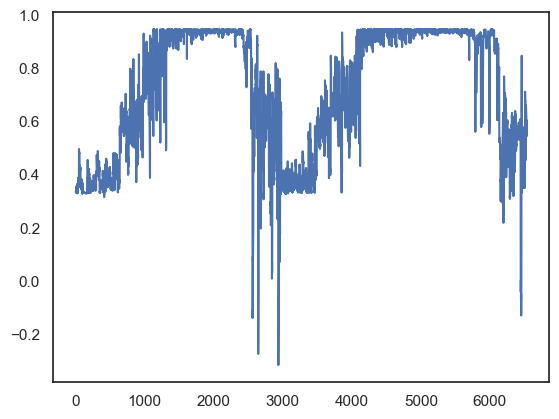

In [72]:
plt.plot(preds.residual)

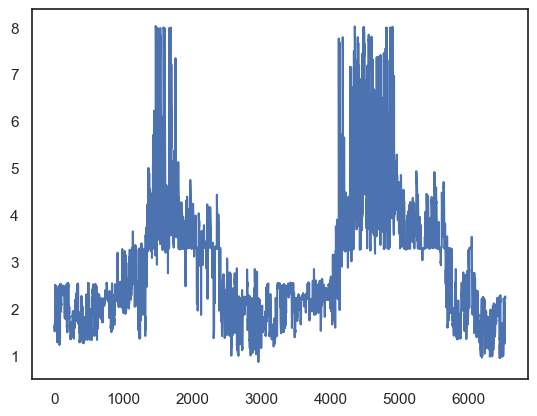

In [73]:
plt.plot(preds.nee)

In [74]:
print(colored("Metrics ", "red"))
for col in gt:
    mmd = compute_mmd(gt[col], preds[col])
    wasstn = wasserstein_distance(gt[col], preds[col])
    kl = compute_kl_divergence(gt[col], preds[col])
    mae = mean_absolute_error(gt[col], preds[col])
    r2 = r2_score(gt[col], preds[col])
    print(colored(col, "blue"), "\nMMD: {}, Wasstn: {}, KL: {}, MAE: {}, R2: {}".format(mmd, wasstn, kl, mae, r2))
    config.eval.mae[col] = mae
    config.eval.r2[col] = r2
    config.eval.kl[col] = kl
    config.eval.wasstn[col] = wasstn
    config.eval.mmd[col] = mmd

with open(save_dir.joinpath("config.json"), "w") as fp:
    json.dump(config.toDict(), fp)

Metrics 
nee 
MMD: 0.24964634696271232, Wasstn: 1.333175274971354, KL: 2.078626783788241, MAE: 1.583354638574715, R2: 0.317985679147629
E0 
MMD: 0.266880548957825, Wasstn: 24.332357968837435, KL: 1.8085902087966763, MAE: 43.876739536982484, R2: -0.6940837599992091
rb 
MMD: 0.18398196378641002, Wasstn: 0.7025116830015168, KL: 1.3712808322569872, MAE: 1.107566388130626, R2: 0.5703026184572748


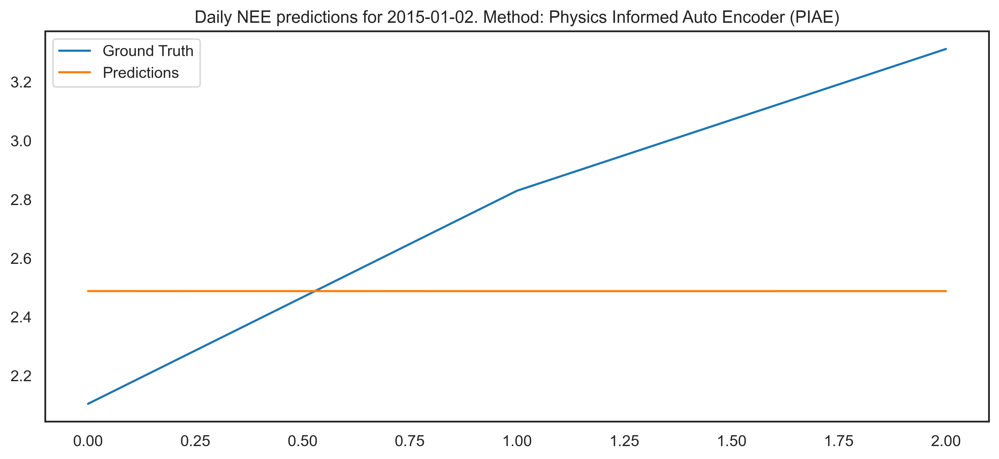

In [75]:
### Daily

test_data['time_diff'] = test_data.DateTime.diff()

test_data['daily_group'] = (test_data.time_diff > pd.Timedelta(hours=2)).cumsum()

mask = (test_data['daily_group'] == 2).values

date = test_data.DateTime[mask].iloc[0]
date = str(date).split(' ')[0]


gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Daily NEE predictions for {date}. Method: Physics Informed Auto Encoder (PIAE)")
fig.savefig("piae_nee_night_daily.png", bbox_inches='tight')


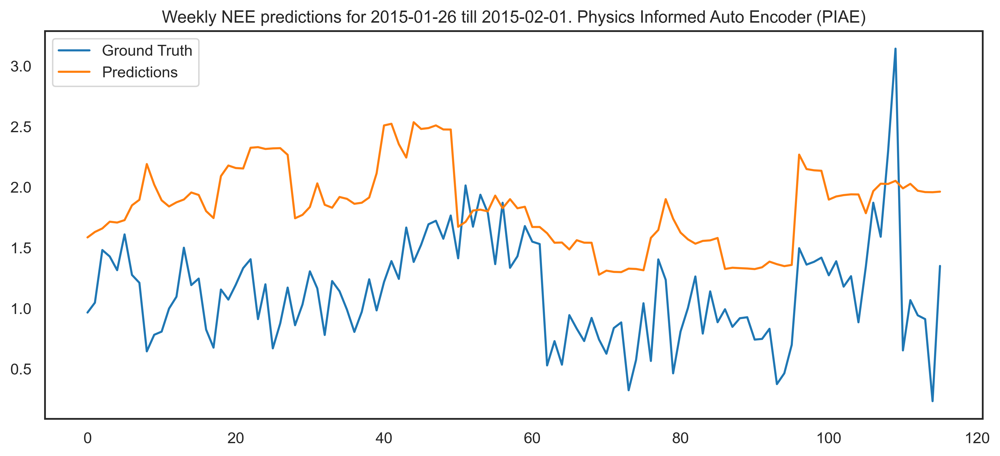

In [76]:
### Weekly

test_data['week_group'] = (test_data['dayofweek'] < test_data['dayofweek'].shift()).cumsum()

mask = test_data.week_group == 4

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Weekly NEE predictions for {date}. Physics Informed Auto Encoder (PIAE)")
fig.savefig("piae_nee_night_weekly.png", bbox_inches='tight')


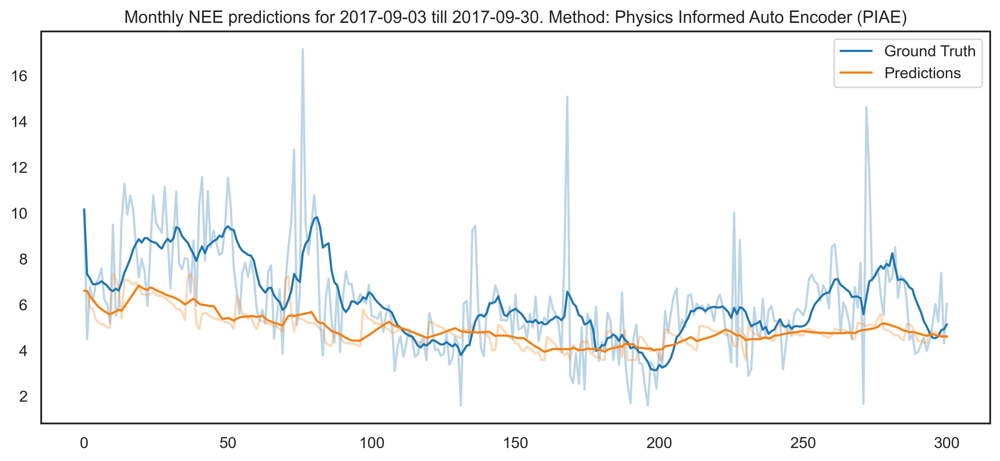

In [54]:
### Monthly

mask = (test_data.DateTime.dt.year == 2017) & (test_data.DateTime.dt.month == 9)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Monthly NEE predictions for {date}. Method: Physics Informed Auto Encoder (PIAE)")
fig.savefig("piae_nee_night_monthly.png", bbox_inches='tight')

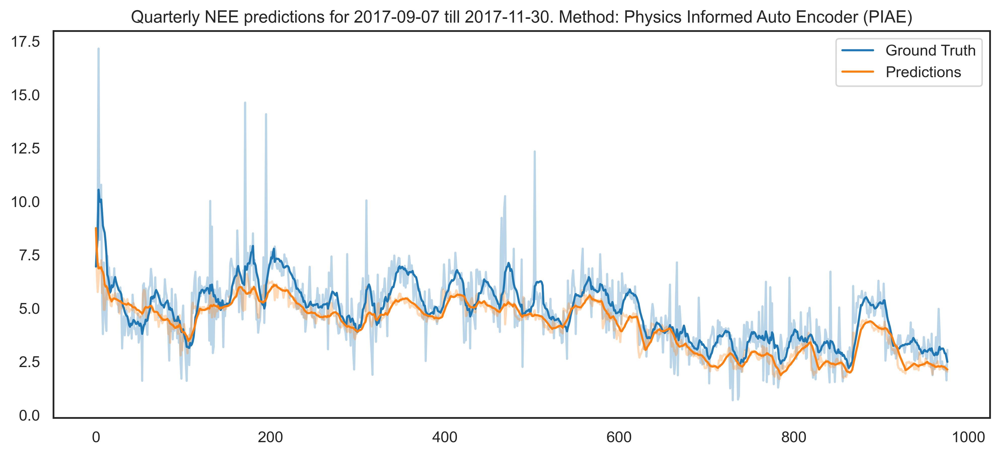

In [52]:
### Quarterly

test_data.season.unique()

mask = (test_data.DateTime.dt.year == 2017) & (test_data.season == 4)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Quarterly NEE predictions for {date}. Method: Physics Informed Auto Encoder (PIAE)")
fig.savefig("piae_nee_night_quarterly.png", bbox_inches='tight')

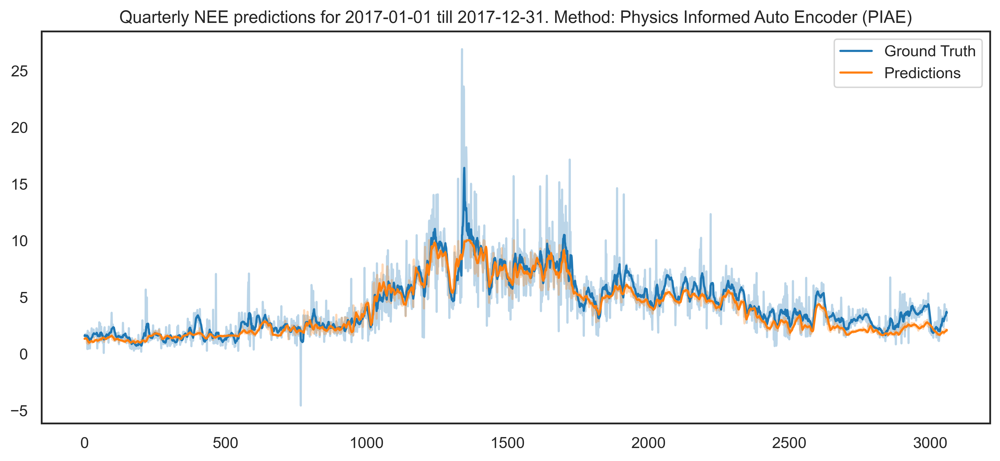

In [53]:
### Quarterly

test_data.season.unique()

mask = (test_data.DateTime.dt.year == 2017)
date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Quarterly NEE predictions for {date}. Method: Physics Informed Auto Encoder (PIAE)")
fig.savefig("piae_nee_night_quarterly.png", bbox_inches='tight')

In [46]:
mask = (test_data["DateTime"].dt.month == 1).values

In [47]:
gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

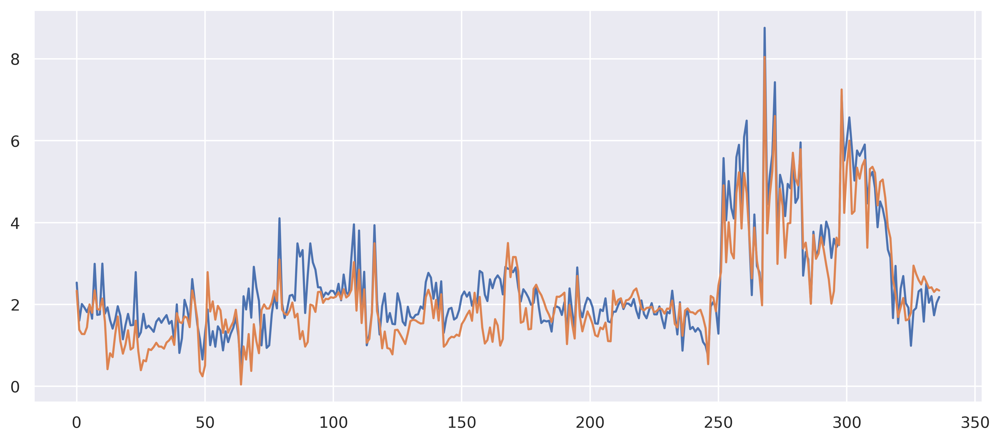

In [48]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis)
ax.plot(preds_vis)
fig.savefig(save_dir.joinpath("nee_predictions_month1.png"))

(0.0, 8.0)

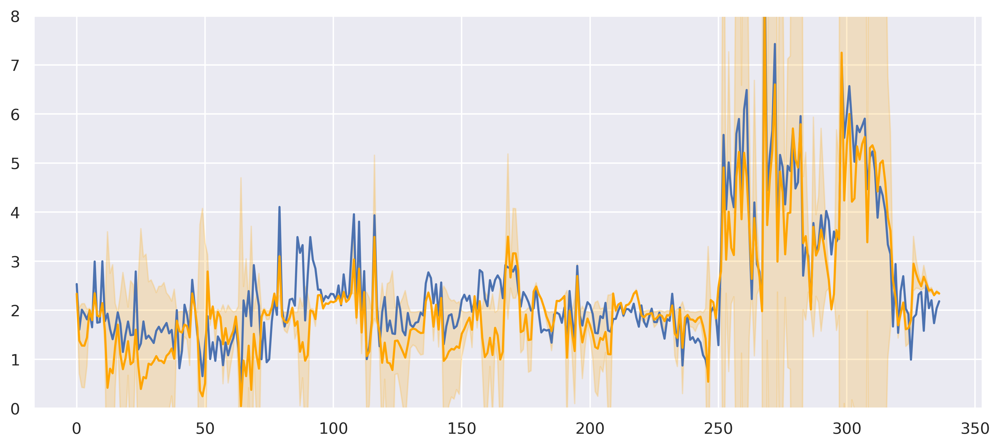

In [49]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
mu = np.mean(preds_vis)
error = np.square(preds_vis - mu)
ax.plot(gt_vis)
ax.plot(preds_vis, color="orange")
ax.fill_between(np.arange(preds_vis.shape[0]), preds_vis - error, preds_vis + error, alpha=0.2, color="orange")

ax.set_ylim(0, 8)

In [178]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

input_rfr = X_train  # list(range(0, 15)) + [16, 17]
rfr = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rfr.fit(input_rfr, NEE_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [181]:
input_rfr = X_test

preds_rfr = rfr.predict(input_rfr)
gt_rfr = NEE_test.values

In [182]:
mmd = compute_mmd(gt_rfr, preds_rfr)
wasstn = wasserstein_distance(gt_rfr, preds_rfr)
kl = compute_kl_divergence(gt_rfr, preds_rfr)
mae = mean_absolute_error(gt_rfr, preds_rfr)
r2 = r2_score(gt_rfr, preds_rfr)
print(colored("NEE", "blue"), "\nMMD: {}, Wasstn: {}, KL: {}, MAE: {}, R2: {}".format(mmd, wasstn, kl, mae, r2))

NEE 
MMD: 0.05524696463562983, Wasstn: 0.17196100373565973, KL: 0.2176137052804488, MAE: 0.8915917744670172, R2: 0.7257114857815055


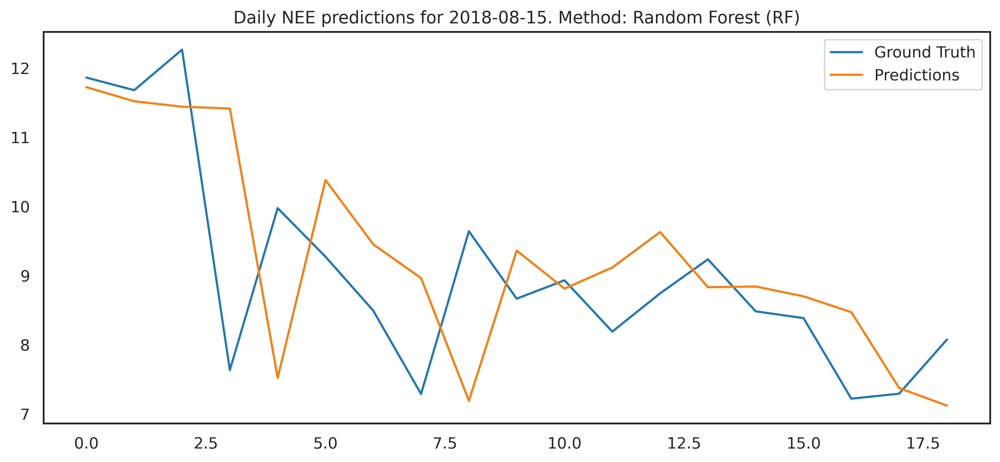

In [183]:
### Daily

test_data['time_diff'] = test_data.DateTime.diff()

test_data['daily_group'] = (test_data.time_diff > pd.Timedelta(hours=2)).cumsum()

mask = (test_data['daily_group'] == 1).values

date = test_data.DateTime[mask].iloc[0]
date = str(date).split(' ')[0]


gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Daily NEE predictions for {date}. Method: Random Forest (RF)")
fig.savefig("RF_nee_night_daily.png", bbox_inches='tight')


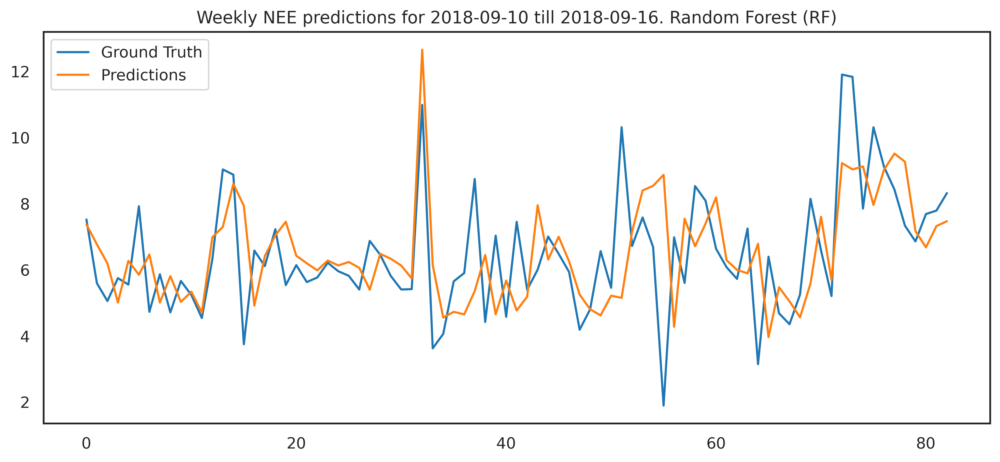

In [184]:
### Weekly

test_data['week_group'] = (test_data['dayofweek'] < test_data['dayofweek'].shift()).cumsum()

mask = test_data.week_group == 4

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Weekly NEE predictions for {date}. Random Forest (RF)")
fig.savefig("RF_nee_night_weekly.png", bbox_inches='tight')


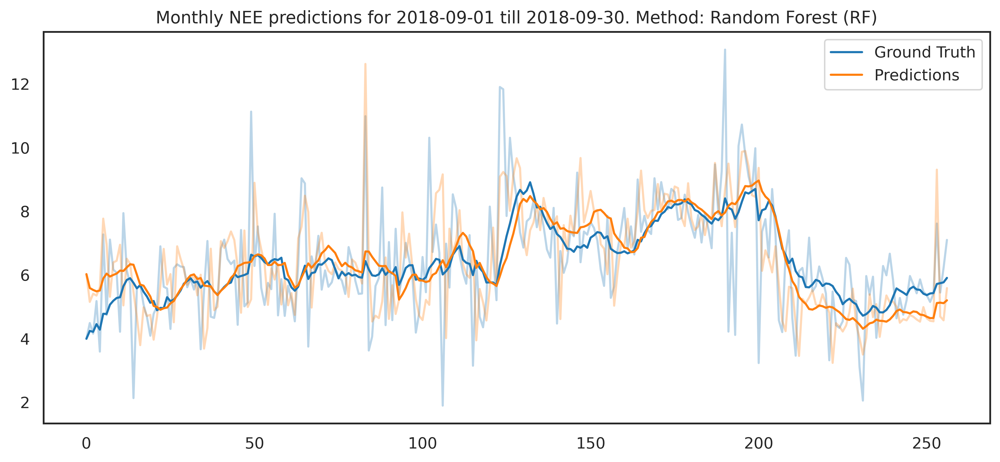

In [177]:
### Monthly

mask = (test_data.DateTime.dt.year == 2018) & (test_data.DateTime.dt.month == 9)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Monthly NEE predictions for {date}. Method: Random Forest (RF)")
fig.savefig("RF_nee_night_monthly.png", bbox_inches='tight')

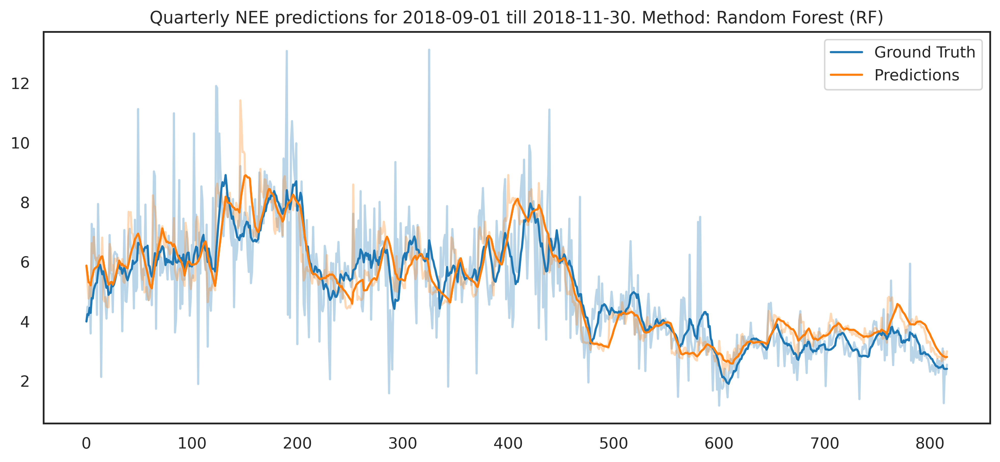

In [130]:
### Quarterly

test_data.season.unique()

mask = (test_data.DateTime.dt.year == 2018) & (test_data.season == 4)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Quarterly NEE predictions for {date}. Method: Random Forest (RF)")
fig.savefig("RF_nee_night_quarterly.png", bbox_inches='tight')

In [131]:

input_rfr = X_train[:, list(range(0, 15)) + [16, 17]]  # list(range(0, 15)) + [16, 17]
rfr = XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rfr.fit(input_rfr, NEE_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=-1,
             num_parallel_tree=None, random_state=42, ...)

In [132]:
input_rfr = X_test[:,list(range(0, 15)) + [16, 17]]

preds_rfr = rfr.predict(input_rfr)
gt_rfr = NEE_test.values

In [133]:
mmd = compute_mmd(gt_rfr, preds_rfr)
wasstn = wasserstein_distance(gt_rfr, preds_rfr)
kl = compute_kl_divergence(gt_rfr, preds_rfr)
mae = mean_absolute_error(gt_rfr, preds_rfr)
r2 = r2_score(gt_rfr, preds_rfr)
print(colored("NEE", "blue"), "\nMMD: {}, Wasstn: {}, KL: {}, MAE: {}, R2: {}".format(mmd, wasstn, kl, mae, r2))

NEE 
MMD: 0.057372811463296335, Wasstn: 0.2589635656289889, KL: 0.2144207206464967, MAE: 1.09421944333918, R2: 0.6401219121036477


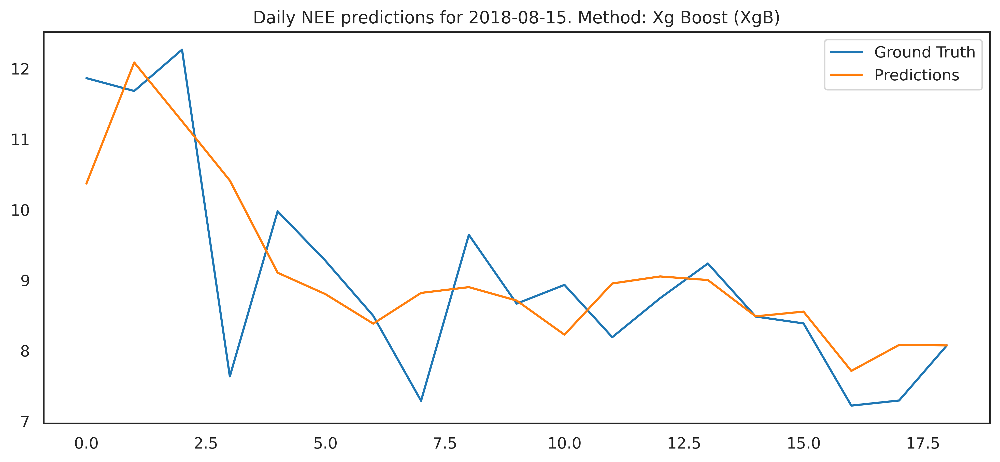

In [134]:
### Daily

test_data['time_diff'] = test_data.DateTime.diff()

test_data['daily_group'] = (test_data.time_diff > pd.Timedelta(hours=2)).cumsum()

mask = (test_data['daily_group'] == 1).values

date = test_data.DateTime[mask].iloc[0]
date = str(date).split(' ')[0]


gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Daily NEE predictions for {date}. Method: Xg Boost (XgB)")
fig.savefig("Xg_nee_night_daily.png", bbox_inches='tight')


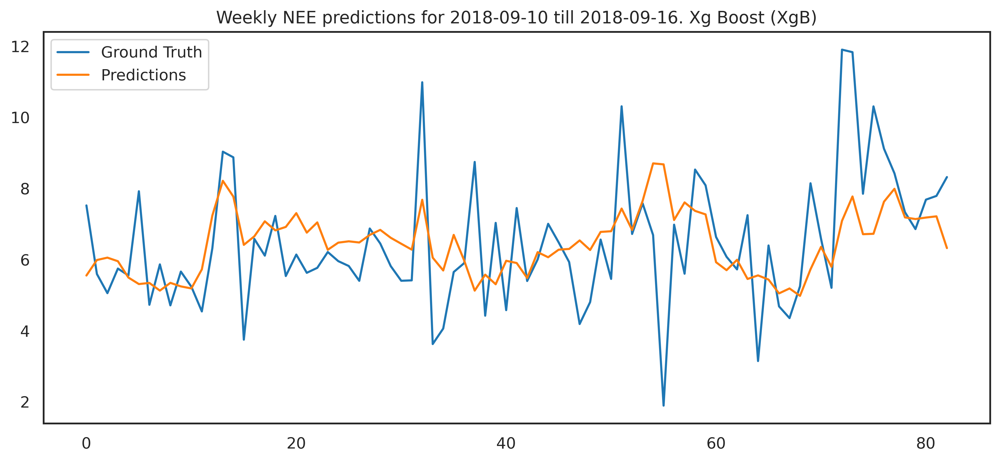

In [135]:
### Weekly

test_data['week_group'] = (test_data['dayofweek'] < test_data['dayofweek'].shift()).cumsum()

mask = test_data.week_group == 4

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Weekly NEE predictions for {date}. Xg Boost (XgB)")
fig.savefig("Xg_nee_night_weekly.png", bbox_inches='tight')


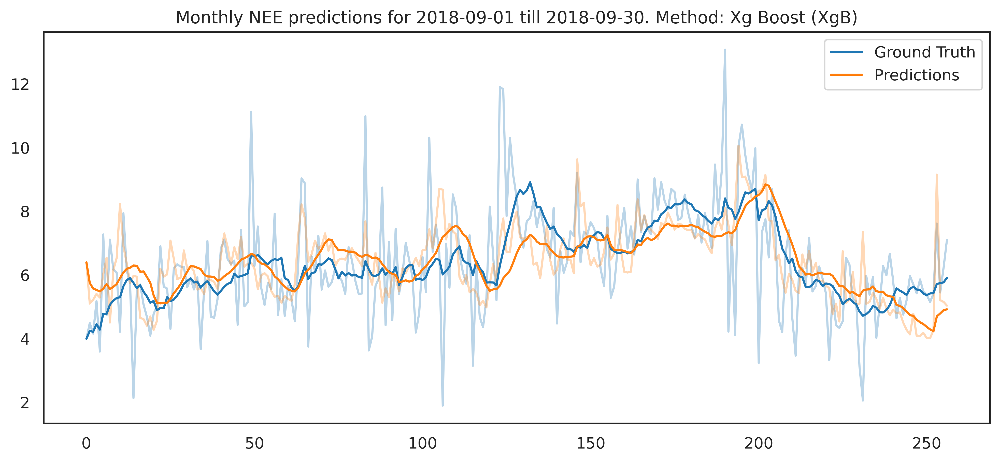

In [136]:
### Monthly

mask = (test_data.DateTime.dt.year == 2018) & (test_data.DateTime.dt.month == 9)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Monthly NEE predictions for {date}. Method: Xg Boost (XgB)")
fig.savefig("Xg_nee_night_monthly.png", bbox_inches='tight')

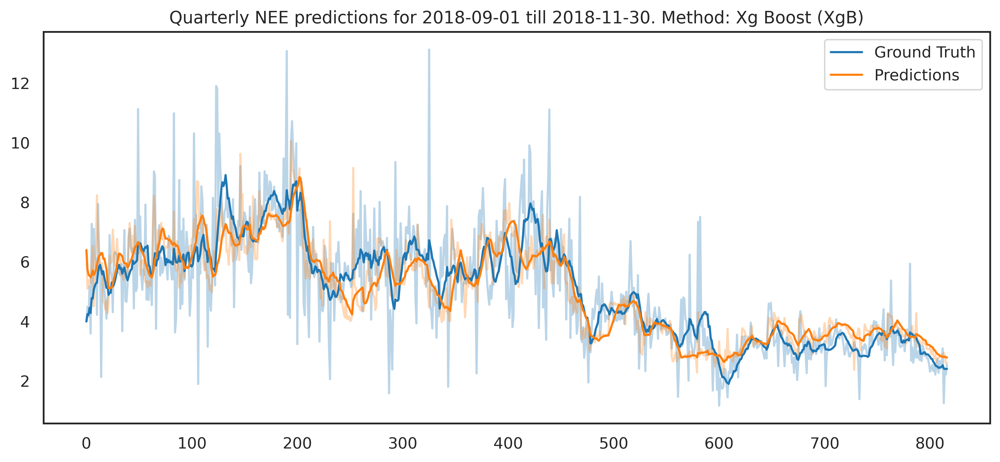

In [137]:
### Quarterly

test_data.season.unique()

mask = (test_data.DateTime.dt.year == 2018) & (test_data.season == 4)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Quarterly NEE predictions for {date}. Method: Xg Boost (XgB)")
fig.savefig("Xg_nee_night_quarterly.png", bbox_inches='tight')

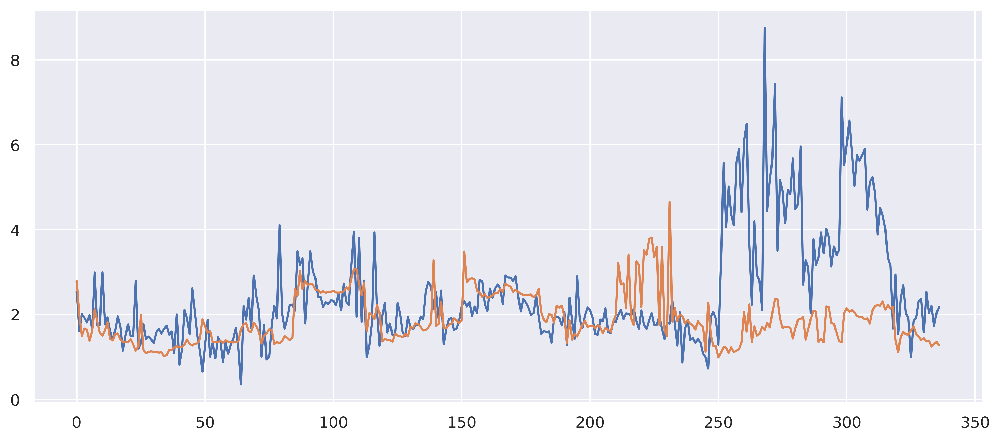

In [106]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
plt.plot(gt_rfr_vis)
plt.plot(preds_rfr_vis)

<BarContainer object of 15 artists>

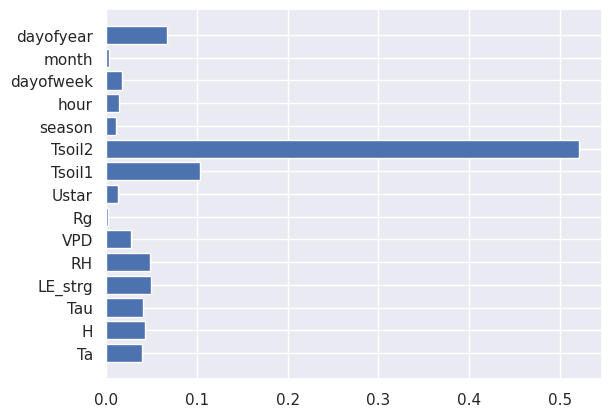

In [107]:
columns = drivers

plt.barh(columns, rfr.feature_importances_)

In [146]:
input_rfr = np.concatenate((X_train, bNEE_train.values.reshape((-1, 1))), axis=1)

In [147]:
rfr = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rfr.fit(input_rfr, NEE_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [148]:
input_rfr = np.concatenate((X_test, bNEE_test.values.reshape((-1, 1))), axis=1)

In [149]:
preds_rfr = rfr.predict(input_rfr)
gt_rfr = NEE_test.values

In [150]:
mean_absolute_error(gt_rfr, preds_rfr), r2_score(gt_rfr, preds_rfr)


(0.892917746627629, 0.7234063644970592)

In [151]:
gt_rfr_vis = gt_rfr[mask]
preds_rfr_vis = preds_rfr[mask]

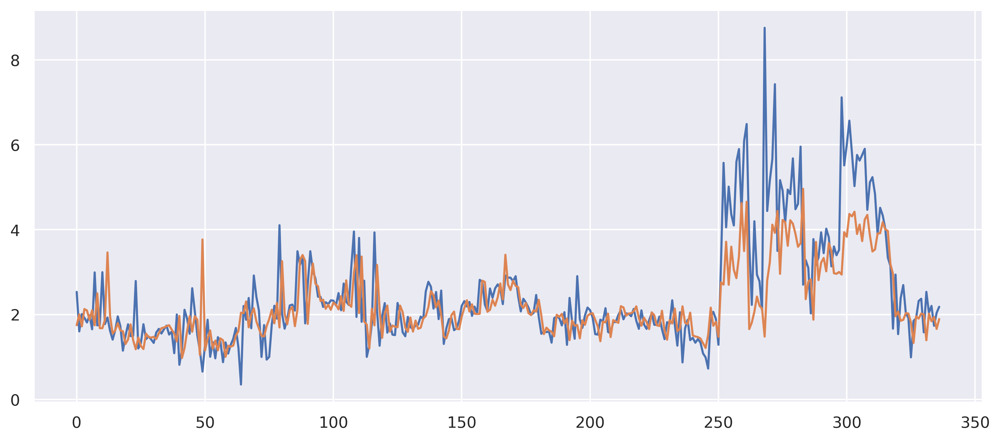

In [152]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
plt.plot(gt_rfr_vis)
plt.plot(preds_rfr_vis)

(0.0, 8.0)

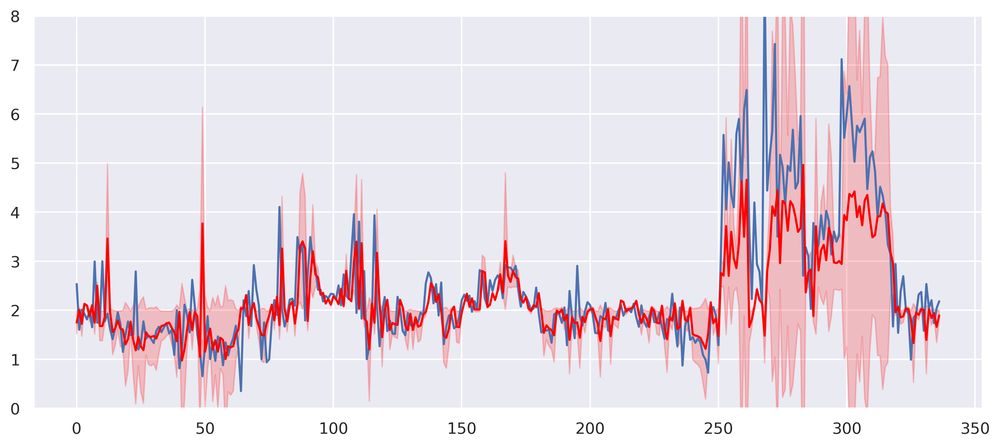

In [154]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
mu = np.mean(preds_rfr_vis)
error = np.square(preds_rfr_vis - mu)
ax.plot(gt_rfr_vis)
ax.plot(preds_rfr_vis, color="red")
ax.fill_between(np.arange(preds_rfr_vis.shape[0]), preds_rfr_vis - error, preds_rfr_vis + error, alpha=0.2, color="red")

ax.set_ylim(0, 8)